# Importing all libraries

In [74]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
sns.set_style('dark')
%matplotlib inline

# Loading movie dataset

In [75]:
movies = pd.read_csv("movies.csv")
movies.head()

,movieId,title,genres
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy
1,2,Jumanji (1995),Adventure|Children|Fantasy
2,3,Grumpier Old Men (1995),Comedy|Romance
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance
4,5,Father of the Bride Part II (1995),Comedy


# Loading ratings dataset

In [76]:
ratings= pd.read_csv("ratings.csv")
ratings.head(10)

,userId,movieId,rating,timestamp
0,1,307,3.5,1256677221
1,1,481,3.5,1256677456
2,1,1091,1.5,1256677471
3,1,1257,4.5,1256677460
4,1,1449,4.5,1256677264
5,1,1590,2.5,1256677236
6,1,1591,1.5,1256677475
7,1,2134,4.5,1256677464
8,1,2478,4.0,1256677239
9,1,2840,3.0,1256677500


# Merging two datasets

In [78]:
movies_rating_data=pd.merge(ratings,movies,on='movieId').drop(["timestamp"], axis = 1)
movies_rating_data.head()

,userId,movieId,rating,title,genres
0,1,307,3.5,Three Colors: Blue (Trois couleurs: Bleu) (1993),Drama
1,6,307,4.0,Three Colors: Blue (Trois couleurs: Bleu) (1993),Drama
2,56,307,4.0,Three Colors: Blue (Trois couleurs: Bleu) (1993),Drama
3,71,307,5.0,Three Colors: Blue (Trois couleurs: Bleu) (1993),Drama
4,84,307,3.0,Three Colors: Blue (Trois couleurs: Bleu) (1993),Drama


# Downsampling

In [112]:
filtered_movies=movies_rating_data.sample(10000)

# Descriptive Analysis

In [113]:
filtered_movies.groupby('title')['rating'].mean().head()

title
(500) Days of Summer (2009)       3.500000
*batteries not included (1987)    2.750000
...And Justice for All (1979)     3.000000
10 (1979)                         3.500000
10 Cloverfield Lane (2016)        3.333333
Name: rating, dtype: float64

In [114]:
filtered_movies.groupby('title')['rating'].mean().sort_values(ascending=False).head()

title
Searchers, The (1956)             5.0
Law Abiding Citizen (2009)        5.0
Life of David Gale, The (2003)    5.0
Little Man Tate (1991)            5.0
Cup, The (Phörpa) (1999)          5.0
Name: rating, dtype: float64

In [115]:
filtered_movies.groupby('title')['rating'].count().sort_values(ascending=False).head()

title
Pulp Fiction (1994)                          35
Shawshank Redemption, The (1994)             34
Toy Story (1995)                             34
Star Wars: Episode IV - A New Hope (1977)    31
Jurassic Park (1993)                         30
Name: rating, dtype: int64

In [116]:
rating_mean=pd.DataFrame(filtered_movies.groupby('title')['rating'].mean().round(1))

In [117]:
rating_mean.head()

,rating
title,
(500) Days of Summer (2009),3.5
*batteries not included (1987),2.8
...And Justice for All (1979),3.0
10 (1979),3.5
10 Cloverfield Lane (2016),3.3


# Movie Title vs Rating

In [118]:
rating_mean['rating_counts']=pd.DataFrame(filtered_movies.groupby('title')['rating'].count())

<AxesSubplot:>

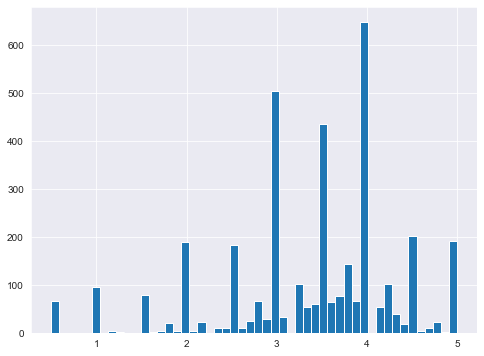

In [119]:
plt.figure(figsize=(8,6))
plt.rcParams['patch.force_edgecolor']=True
rating_mean['rating'].hist(bins=50)

In [120]:
movie_rating_user=filtered_movies.pivot_table(index='userId',columns='title',values='rating')

In [121]:
movie_rating_user.head(10)

title,(500) Days of Summer (2009),*batteries not included (1987),...And Justice for All (1979),10 (1979),10 Cloverfield Lane (2016),10 Things I Hate About You (1999),100 Men and a Girl (One Hundred Men and a Girl) (1937),101 Dalmatians (1996),101 Dalmatians (One Hundred and One Dalmatians) (1961),102 Dalmatians (2000),...,Zodiac (2007),Zombieland (2009),Zoolander (2001),Zootopia (2016),Zulu (1964),xXx (2002),xXx: State of the Union (2005),¡Three Amigos! (1986),Он вам не Димон (2017),Цветик-семицветик (1948)
userId,,,,,,,,,,,,,,,,,,,,,
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
71,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
138,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [122]:
a=movie_rating_user['Pulp Fiction (1994)']
a.head(10)

userId
4     NaN
34    NaN
46    NaN
71    NaN
73    NaN
84    NaN
134   NaN
138   NaN
214   NaN
255   NaN
Name: Pulp Fiction (1994), dtype: float64

# Movie Correlation

In [123]:
movies_corr=movie_rating_user.corrwith(a)
movie_rating_user_corr=pd.DataFrame(movies_corr,columns=['Correlation'])
movie_rating_user_corr.dropna(inplace=True)
movie_rating_user_corr.head(100)

,Correlation
title,
Pulp Fiction (1994),1.0


In [124]:
movies_rating_user_corr=movie_rating_user_corr.join(rating_mean['rating_counts'])
movies_rating_user_corr.head()

,Correlation,rating_counts
title,,
Pulp Fiction (1994),1.0,35


# Distribution of Ratings vs Frequency

Text(0.5, 1.0, 'Distribution of ratings')

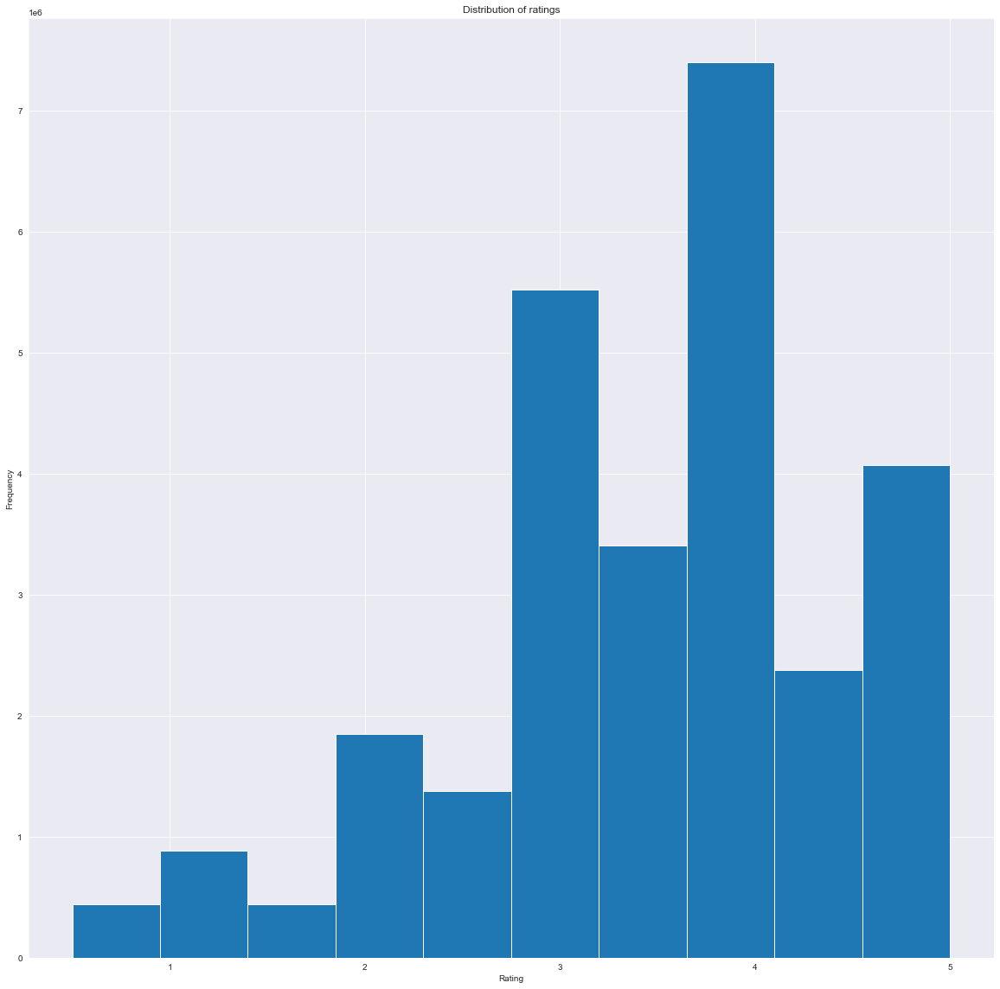

In [125]:
ratings['rating'].hist(grid=True)
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.title('Distribution of ratings')

## Visualizing ratings after normalization

Text(0.5, 1.0, 'Distribution of normalized ratings')

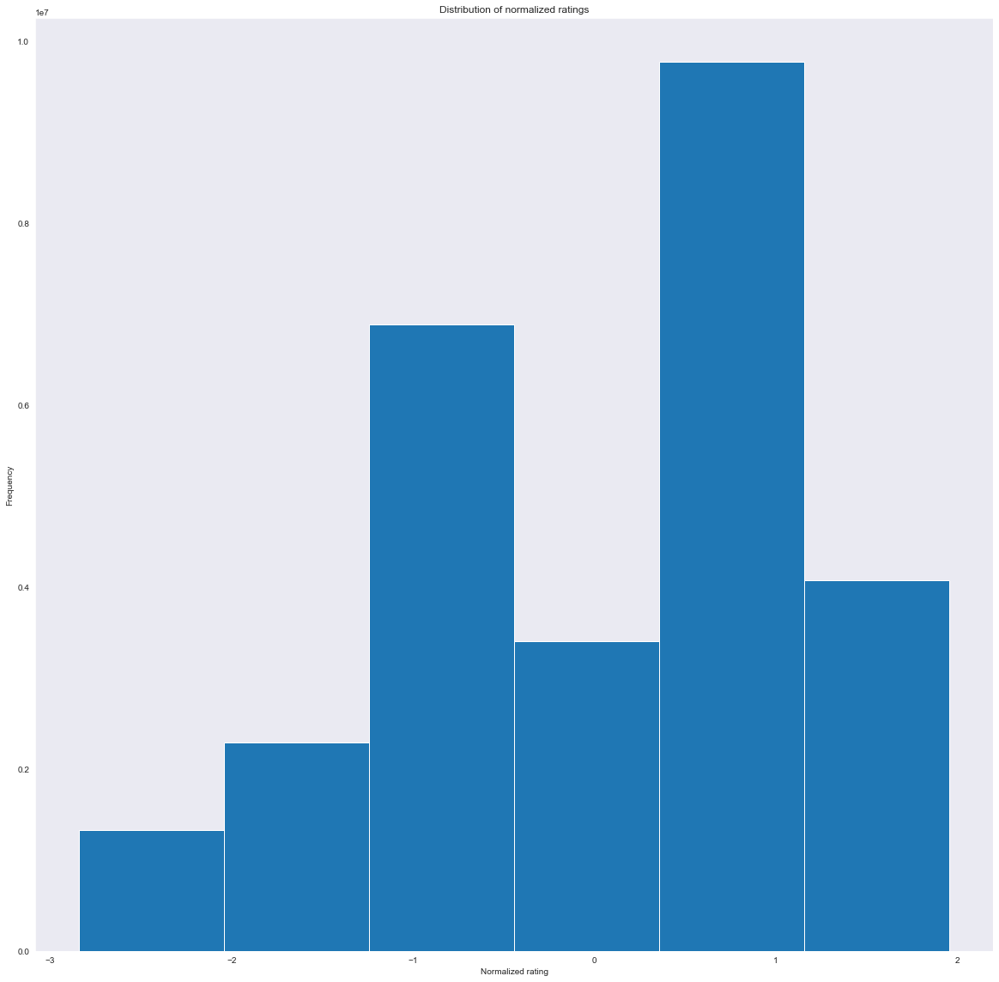

In [126]:
from sklearn.preprocessing import scale
binwidth = 0.8
data = scale(ratings['rating'].astype(float))
plt.hist(data, bins=np.arange(min(data), max(data) + binwidth, binwidth))    # Z-score normalization
plt.xlabel('Normalized rating')
plt.ylabel('Frequency')
plt.title('Distribution of normalized ratings')

# We are defining X and Y

In [127]:
X = ratings[['userId', 'movieId']].values
y = ratings['rating'].values

print("X")
print (X)
print ('y')
print (y)

X
[[     1    307]
 [     1    481]
 [     1   1091]
 ...
 [283228  34405]
 [283228  44761]
 [283228  54286]]
y
[3.5 3.5 1.5 ... 4.5 4.5 4.5]


# Splitting the datsets into train and test data

function splits the 100k interactions randomly without considering timestamp and uses the 70% of the data as training samples and the rest 30% as test samples by default

In [128]:
from sklearn.model_selection import train_test_split

In [129]:
training_data, testing_data = train_test_split(filtered_movies, test_size=0.3, random_state=25)

In [130]:
training_data.head()

,userId,movieId,rating,title,genres
13379386,190339,3147,4.0,"Green Mile, The (1999)",Crime|Drama
24180747,136016,95307,1.5,Rock of Ages (2012),Comedy|Drama|Musical|IMAX
11840340,231186,56782,5.0,There Will Be Blood (2007),Drama|Western
27406540,128244,845,4.0,"Day the Sun Turned Cold, The (Tianguo niezi) (...",Drama
15571039,281864,1218,4.5,"Killer, The (Die xue shuang xiong) (1989)",Action|Crime|Drama|Thriller


In [131]:
training_data.shape

(7000, 5)

In [132]:
pip install scipy

Note: you may need to restart the kernel to use updated packages.


In [133]:
%matplotlib inline
import pandas as pd
import networkx as nx
from networkx.algorithms import community
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
from collections import Counter
import sys
import os
from __future__ import division
plt.rcParams["figure.figsize"] = (20,20)
import tqdm as tqdm

warnings.filterwarnings('ignore')
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

In [104]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [134]:
import networkx as nx
import plotly.graph_objects as go

In [135]:
training_data_set = training_data[['userId', 'movieId', 'genres', 'rating']]

# Choosing only required columns from training dataset

In [136]:
training_data_set

,userId,movieId,genres,rating
13379386,190339,3147,Crime|Drama,4.0
24180747,136016,95307,Comedy|Drama|Musical|IMAX,1.5
11840340,231186,56782,Drama|Western,5.0
27406540,128244,845,Drama,4.0
15571039,281864,1218,Action|Crime|Drama|Thriller,4.5
...,...,...,...,...
1505846,12152,204,Action,3.0
10682940,273473,7438,Action|Drama|Thriller,4.0
17245862,18927,3408,Drama,5.0
14213324,106397,112852,Action|Adventure|Sci-Fi,4.5


In [137]:
G = nx.Graph()

In [138]:
G = nx.from_pandas_edgelist(training_data_set, 'movieId', 'userId')


# Plotting the Graph for training dataset

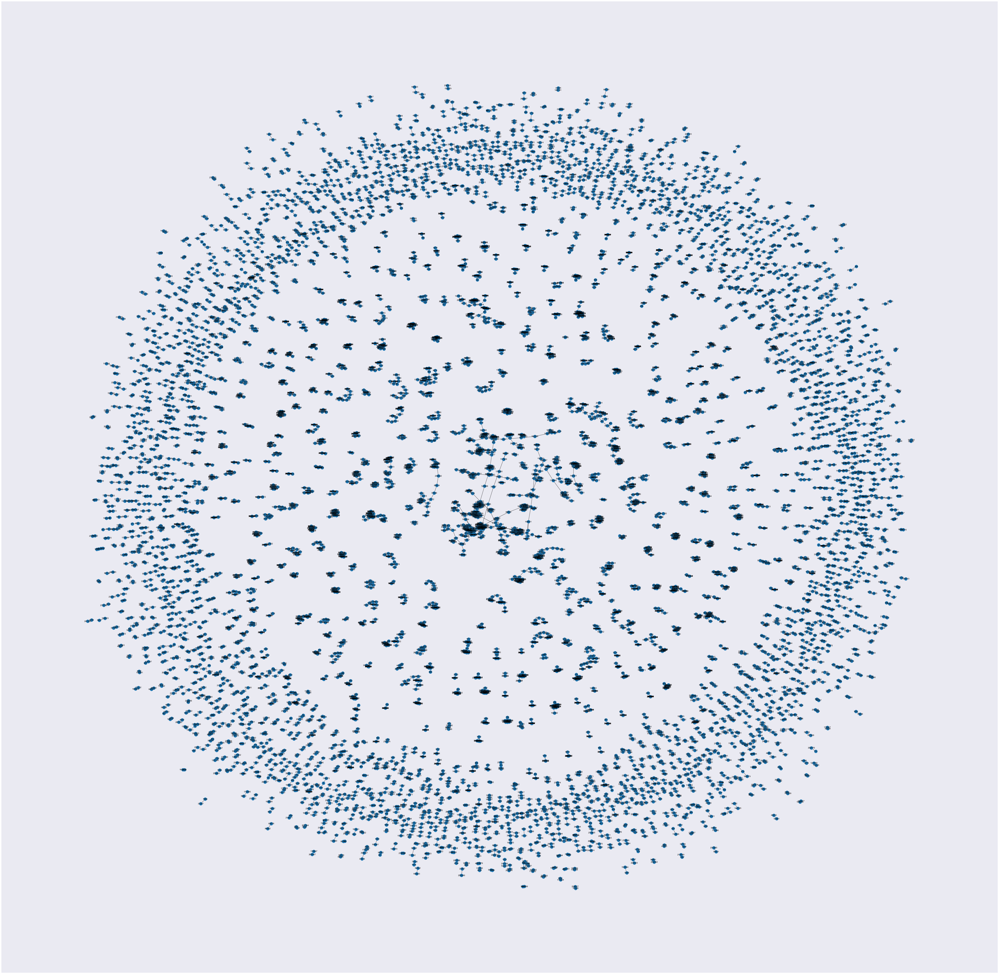

In [139]:
from matplotlib.pyplot import figure
figure(figsize=(100,100))
nx.draw_networkx(G, with_labels=True)

In [140]:
import os
from collections import defaultdict
import math
import networkx as nx
import random
from tqdm import tqdm
from zipfile import ZipFile
from urllib.request import urlretrieve
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [141]:
min_rating = 5
pair_frequency = defaultdict(int)
item_frequency = defaultdict(int)

# Filter instances where rating is greater than or equal to min_rating.
rated_movies = ratings[ratings.rating >= min_rating]
# Group instances by user.
movies_grouped_by_users = list(rated_movies.groupby("userId"))
for group in tqdm(
    movies_grouped_by_users,
    position=0,
    leave=True,
    desc="Compute movie rating frequencies",
):
    # Get a list of movies rated by the user.
    current_movies = list(group[1]["movieId"])

    for i in range(len(current_movies)):
        item_frequency[current_movies[i]] += 1
        for j in range(i + 1, len(current_movies)):
            x = min(current_movies[i], current_movies[j])
            y = max(current_movies[i], current_movies[j])
            pair_frequency[(x, y)] += 1

Compute movie rating frequencies: 100%|███████████████████████████████████████| 241003/241003 [05:35<00:00, 719.03it/s]


In [142]:
min_weight = 10
D = math.log(sum(item_frequency.values()))

# Create the movies undirected graph.
movies_graph = nx.Graph()
# Add weighted edges between movies.
# This automatically adds the movie nodes to the graph.
for pair in tqdm(
    pair_frequency, position=0, leave=True, desc="Creating the movie graph"
):
    x, y = pair
    xy_frequency = pair_frequency[pair]
    x_frequency = item_frequency[x]
    y_frequency = item_frequency[y]
    pmi = math.log(xy_frequency) - math.log(x_frequency) - math.log(y_frequency) + D
    weight = pmi * xy_frequency
    # Only include edges with weight >= min_weight.
    if weight >= min_weight:
        movies_graph.add_edge(x, y, weight=weight)

Creating the movie graph: 100%|████████████████████████████████████████| 20689190/20689190 [01:32<00:00, 224067.59it/s]


In [143]:
print("Total number of graph nodes:", movies_graph.number_of_nodes())
print("Total number of graph edges:", movies_graph.number_of_edges())

Total number of graph nodes: 23904
Total number of graph edges: 10045343


In [144]:
degrees = []
for node in movies_graph.nodes:
    degrees.append(movies_graph.degree[node])

print("Average node degree:", round(sum(degrees) / len(degrees), 2))

Average node degree: 840.47


In [145]:
vocabulary = ["NA"] + list(movies_graph.nodes)
vocabulary_lookup = {token: idx for idx, token in enumerate(vocabulary)}

Next, let’s create another dataframe that shows the nodes and their number of connections

# Connection between UserID and MovieID

In [146]:
leaderboard = {}
for x in G.nodes:
 leaderboard[x] = len(G[x])
s = pd.Series(leaderboard, name='connections')
df2 = s.to_frame().sort_values('connections', ascending=False)
df2.head()

,connections
296,28
3578,22
260,22
1270,21
1,21


In [147]:
testing_data_set = testing_data[['userId', 'movieId', 'genres', 'rating']]

# Testing Dataset

In [148]:
testing_data_set

,userId,movieId,genres,rating
15041949,99715,112,Action|Adventure|Comedy|Crime,3.0
24664521,271979,3943,Comedy,3.0
22859508,209734,143859,Comedy,3.0
12728806,29704,1247,Comedy|Drama|Romance,4.0
5141659,104621,1270,Adventure|Comedy|Sci-Fi,4.5
...,...,...,...,...
3326803,153154,588,Adventure|Animation|Children|Comedy|Musical,5.0
5195015,148044,1275,Action|Adventure|Fantasy,5.0
14063543,50132,99114,Action|Drama|Western,5.0
411209,164799,1,Adventure|Animation|Children|Comedy|Fantasy,5.0


In [149]:
G1 = nx.Graph()

In [150]:
G1 = nx.from_pandas_edgelist(testing_data_set, 'movieId', 'userId')

# Plotting the graph for Testing dataset

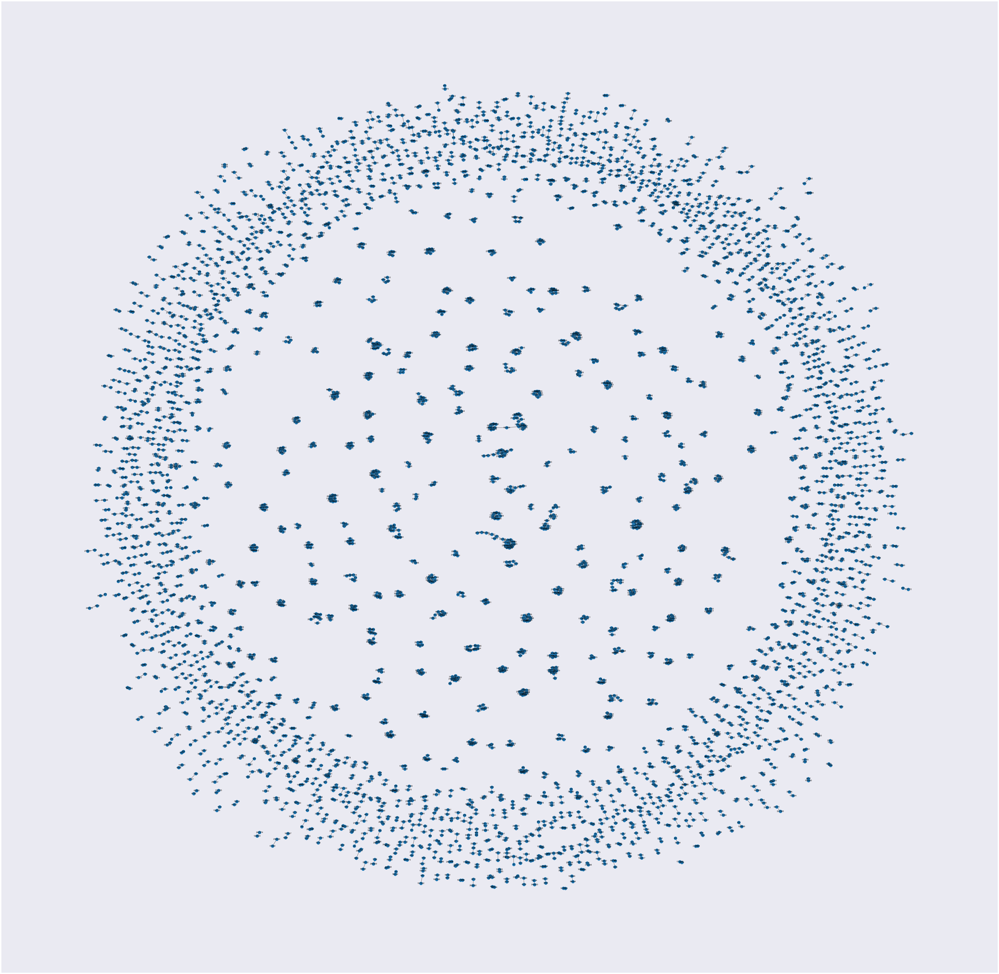

In [151]:
from matplotlib.pyplot import figure
figure(figsize=(100,100))
nx.draw_networkx(G1, with_labels=True)

# degree of centraility for Training dataset

In [153]:
degree_dict = dict(G.degree(G.nodes()))
nx.set_node_attributes(G, degree_dict, 'degree')

In [154]:
from operator import itemgetter

In [155]:
sorted_degree = sorted(degree_dict.items(), key=itemgetter(1), reverse=True)


In [156]:
print("Top 20 nodes by degree:")
for d in sorted_degree[:20]:
    print(d)

Top 20 nodes by degree:
(296, 28)
(260, 22)
(3578, 22)
(1, 21)
(1270, 21)
(480, 20)
(590, 20)
(7153, 19)
(318, 19)
(356, 19)
(2571, 18)
(527, 18)
(593, 18)
(1210, 17)
(2858, 17)
(2762, 17)
(588, 17)
(110, 16)
(608, 16)
(344, 16)


In [159]:
pip install community

  Created wheel for community: filename=community-1.0.0b1-py3-none-any.whl size=2153 sha256=e586449282ede296bc5e452e2787c373ed29f2cdf4c1f1fe19e2363f3364466a
  Stored in directory: c:\users\irfan\appdata\local\pip\cache\wheels\e5\32\7b\aebaa96975f39189b78d7b123cf90e5fd2f0418953833b3043
Successfully built community
Note: you may need to restart the kernel to use updated packages.


In [162]:
pip install python-louvain

  Created wheel for python-louvain: filename=python_louvain-0.16-py3-none-any.whl size=9407 sha256=b295e61b43420b961386388db87a9fc37a196fc752b317fa490aad77fe4f986e
  Stored in directory: c:\users\irfan\appdata\local\pip\cache\wheels\4d\7c\b6\79b198e4ec43f915fbdf967953d48b89a18893b12aa9df0ae2
Successfully built python-louvain
Note: you may need to restart the kernel to use updated packages.


# Finding communities for Training dataset

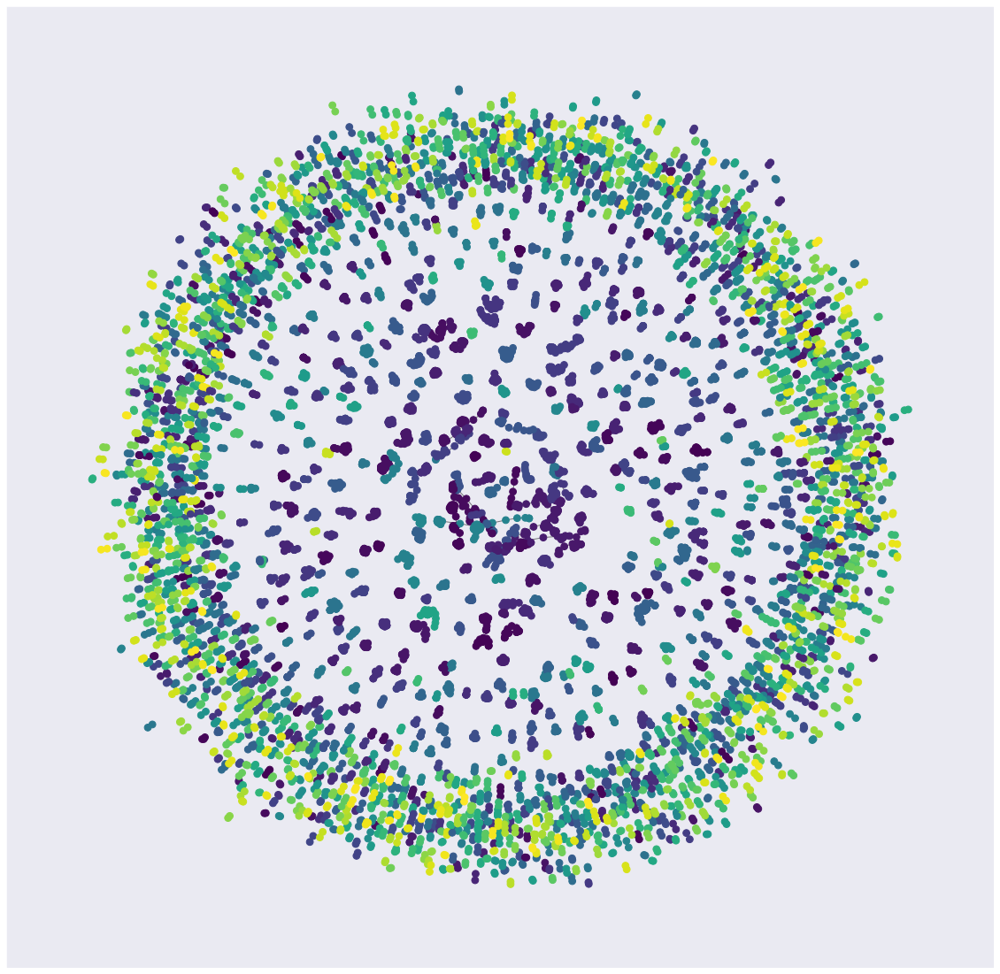

In [163]:
from networkx.algorithms import community
from networkx.algorithms.community.centrality import girvan_newman
from community import community_louvain
import matplotlib.cm as cm
# communities_generator = girvan_newman(subG)
partition = community_louvain.best_partition(G)
partition
# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=60,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.5)
plt.show()

# Finding communities for testing dataset

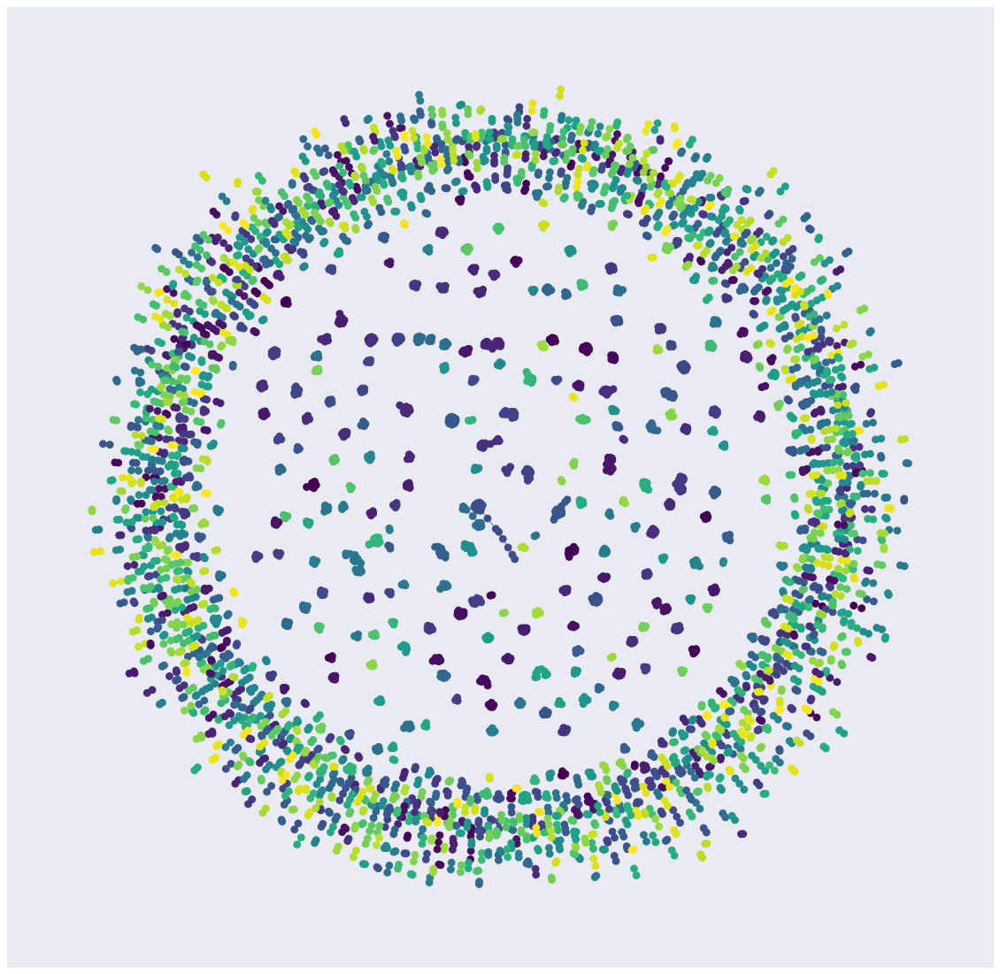

In [164]:
from networkx.algorithms.community.centrality import girvan_newman
from community import community_louvain
import matplotlib.cm as cm
# communities_generator = girvan_newman(subG)
partition = community_louvain.best_partition(G1)
partition
# draw the graph
pos = nx.spring_layout(G1)
# color the nodes according to their partition
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(G1, pos, partition.keys(), node_size=60,
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G1, pos, alpha=0.5)
plt.show()

# 2.1

In [ ]:
COLUMN_NAMES = ["node","degree"]
degree_centrality = pd.DataFrame(columns=COLUMN_NAMES)
total_nodes = degree_centrality['node']  
degree_count = degree_centrality['degree'] 
m = degree_centrality[degree_centrality['node'].isin(number_of_nodes())
m.sort_values('degree', ascending=False)[:1]

# 2.2

In [ ]:
COLUMN_NAMES = ["node","degree"]
degree_centrality
pd.DataFrame(columns=COLUMN_NAMES)
total_nodes = degree_centrality['node'] 
degree count = degree_centrality['degree'] 
m = degree_centrality[degree_centrality['node'].isin(number_of_nodes())]
m. sort_values ('degree', ascending=False)[:1]